# 1. Datasets 

In [53]:
from tensorflow import keras
import tensorflow_datasets as tfds 
import numpy as np 

In [54]:
# https://www.tensorflow.org/datasets/catalog/imdb_reviews
imdb = tfds.load('imdb_reviews', as_supervised=True)

# Split data with train/test sentences / label
train_data, test_data = imdb["train"], imdb["test"]

In [55]:
# https://stackoverflow.com/questions/63909553/what-is-tensorflow-python-data-ops-dataset-ops-prefetchdataset
# Load label & texts 
train_sentences = [str(s.numpy()) for s,l in train_data]        # Convert tensor to np string with str(s.numpy)
train_labels = np.array([l.numpy() for s,l in train_data])

test_sentences = [str(s.numpy()) for s,l in test_data]
test_labels= np.array([l.numpy() for s,l in test_data])

In [56]:
# Check data 
print(train_sentences[0], train_labels[0], sep = "\n\n")

b"This was an absolutely terrible movie. Don't be lured in by Christopher Walken or Michael Ironside. Both are great actors, but this must simply be their worst role in history. Even their great acting could not redeem this movie's ridiculous storyline. This movie is an early nineties US propaganda piece. The most pathetic scenes were those when the Columbian rebels were making their cases for revolutions. Maria Conchita Alonso appeared phony, and her pseudo-love affair with Walken was nothing but a pathetic emotional plug in a movie that was devoid of any real meaning. I am disappointed that there are movies like this, ruining actor's like Christopher Walken's good name. I could barely sit through it."

0


In [76]:
type(np.array(train_sentences))

numpy.ndarray

# 2. Tokenization

In [57]:
# Split sentence collect word token, encoding word, built vocab sort by freq, return indices
from keras.preprocessing.text import Tokenizer
# Padding vector sequence (tokenizer of sentence) to vectors same shape
from keras.preprocessing.sequence import pad_sequences

In [58]:
# Size of vocab (dim each word before pass Embedding Layer)
vocab_size = 10000
# Max length of sentences 
max_length = 140 
# Embedding Layer Dim: Aim covert large dim to small dim
embedding_dim = 64

In [59]:
# Init object with oov_token (words out of vocabulary)
tokenizer = Tokenizer(num_words = vocab_size, oov_token = "<OOV>")
tokenizer.fit_on_texts(train_sentences)
# Table of indices with tokenizer.word_index
# Sort from OOV (1) to inf, smaller ~ more freq

# Convert sentence (text str) to sequences (each word represented by 1 int)
train_sequences = tokenizer.texts_to_sequences(train_sentences)
test_sequences = tokenizer.texts_to_sequences(test_sentences)

In [60]:
# sequence just only storage index of word in one-hot vector
# if input to embedding, tf auto convert index to onehotvector, suitable for embedding layer

# [59, 12, 14, 35, 439, 400, 18, 174, 29, 1] just only index of word in vocab 
train_sequences[0][:10]

[59, 12, 14, 35, 439, 400, 18, 174, 29, 1]

In [61]:
# Limit size of sentences, 140 words, each sentences has same shape
# Padding 0 (same as CNN) / Truncating return 140
padded_train_sequences = pad_sequences(train_sequences, maxlen=max_length, truncating='post', padding="post")
padded_test_sequences = pad_sequences(test_sequences, maxlen=max_length, truncating='post', padding='post')

In [62]:
# Check padded_train_sequences
print(padded_train_sequences, padded_train_sequences.shape, padded_test_sequences.shape, sep = "\n")

[[  59   12   14 ...    0    0    0]
 [ 256   28   78 ...    0    0    0]
 [   1 6175    2 ...    0    0    0]
 ...
 [7629   37   11 ... 2743   21 1563]
 [2677   11  216 ... 1048   37   31]
 [3875    5   31 ...    1 2238   42]]
(25000, 140)
(25000, 140)


# 3. Embedding Layer

In [63]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Flatten, Dense

Keras makes it easy to use word embeddings. Take a look at the [Embedding](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding) layer.

The Embedding layer can be understood as a lookup table that maps from integer indices (which stand for specific words) to dense vectors (their embeddings). The dimensionality (or width) of the embedding is a parameter you can experiment with to see what works well for your problem, much in the same way you would experiment with the number of neurons in a Dense layer.


In [64]:
# Define Model 
model = Sequential([
        # Convert dim 10000 -> 64, requires max_length of sentence = 140
        Embedding(vocab_size, embedding_dim, input_length= max_length),
        # https://stackoverflow.com/questions/44572141/why-do-we-flatten-the-data-before-we-feed-it-into-tensorflow
        Flatten(),
        Dense(20),
        # Return prob 0 to 1, so we need output is R(0->1)
        Dense(1)])

In [65]:
# Use TensorBoard to visualize metrics including loss and accuracy
tensorboard_callback = keras.callbacks.TensorBoard(log_dir="logs")

# Compile Model 
# https://stats.stackexchange.com/questions/260505/should-i-use-a-categorical-cross-entropy-or-binary-cross-entropy-loss-for-binary
model.compile(loss = 'binary_crossentropy',
          # https://viblo.asia/p/optimizer-hieu-sau-ve-cac-thuat-toan-toi-uu-gdsgdadam-Qbq5QQ9E5D8
          optimizer = 'adam', 
          metrics = ["acc"])

In [66]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 140, 64)           640000    
                                                                 
 flatten_3 (Flatten)         (None, 8960)              0         
                                                                 
 dense_6 (Dense)             (None, 20)                179220    
                                                                 
 dense_7 (Dense)             (None, 1)                 21        
                                                                 
Total params: 819,241
Trainable params: 819,241
Non-trainable params: 0
_________________________________________________________________


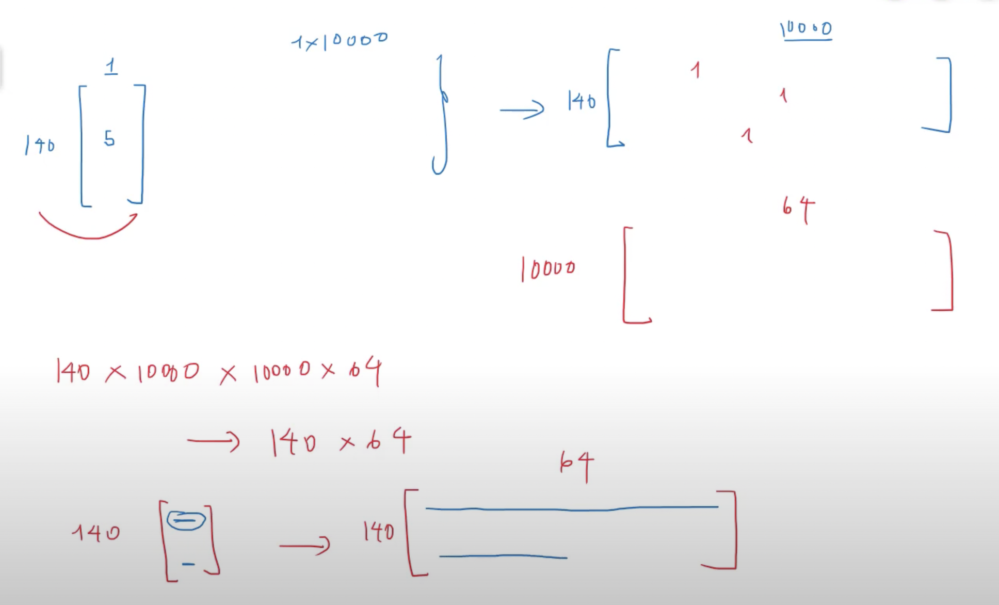

* First, we limit word of a sentence = 140, and after Tokenization, we collected a vector word (token freq, check indices by tokenizer.word_index) 
* To suitable for input of Embedding Layer (need one-hot vector), TF auto convert vector (140,1) to (140,10000) with 10000 dims of words. Word sort by index in orginal vector tokenizer.
* Above this diagram, we can calculate weight matrix has shape (10000,64)
* After Embedding Layer, we collect a matrix shape (140,64), each row is word embedding of original word (one-hot vector)

In [80]:
# Fit Model 
model.fit(padded_train_sequences, train_labels,
          epochs = 15,
          validation_data=(padded_test_sequences, test_labels),
          callbacks=[tensorboard_callback])
# With this approach the model reaches a validation accuracy of around 78% (note that the model is overfitting since training accuracy is higher).

Epoch 1/15
782/782 [==============================] - 7s 9ms/step - loss: 0.3289 - acc: 0.9233 - val_loss: 1.0018 - val_acc: 0.7656
Epoch 2/15
782/782 [==============================] - 7s 10ms/step - loss: 0.1666 - acc: 0.9753 - val_loss: 1.2583 - val_acc: 0.7824
Epoch 3/15
782/782 [==============================] - 7s 8ms/step - loss: 0.2247 - acc: 0.9652 - val_loss: 1.5976 - val_acc: 0.7650
Epoch 4/15
782/782 [==============================] - 7s 8ms/step - loss: 0.1177 - acc: 0.9856 - val_loss: 1.6953 - val_acc: 0.7738
Epoch 5/15
782/782 [==============================] - 7s 9ms/step - loss: 0.1224 - acc: 0.9851 - val_loss: 1.9068 - val_acc: 0.7636
Epoch 6/15
782/782 [==============================] - 7s 9ms/step - loss: 0.1129 - acc: 0.9870 - val_loss: 1.8901 - val_acc: 0.7734
Epoch 7/15
782/782 [==============================] - 7s 8ms/step - loss: 0.0856 - acc: 0.9933 - val_loss: 1.9588 - val_acc: 0.7745
Epoch 8/15
782/782 [==============================] - 7s 8ms/step - loss: 0

In [81]:
# TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# 4. Predict 

In [84]:
new_sentence = ["I rarely watch film because i don't have more time."]

new_sequence = tokenizer.texts_to_sequences(new_sentence)
padded_new = pad_sequences(new_sequence, maxlen=max_length, truncating="post", padding="post")
padded_new

array([[  11, 1738,  107,   20,   87,   11,  174,   28,   53,   60,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0]], dtype=int32)

In [85]:
# Result negative 
model.predict(padded_new)

array([[0.2175185]], dtype=float32)

# 5. Save Weight

In [86]:
# Matrix Embedding
matrix_embedding = model.layers[0]
# Get Weight
weights_embedding = matrix_embedding.get_weights()[0]
weights_embedding.shape

(10000, 64)

In [88]:
# Save file io, add meta.tsv & vec.tsv to http://projector.tensorflow.org
import io

out_v = io.open('vecs.tsv', 'w', encoding='utf-8')
out_m = io.open('meta.tsv', 'w', encoding='utf-8')

for idx in range(1, vocab_size):
  word = tokenizer.index_word[idx]
  vector = weights_embedding[idx]
  out_m.write(word + "\n")
  out_v.write('\t'.join([str(x) for x in vector]) + "\n")

out_m.close()
out_v.close()

![](img/2022-03-09-02-22-37.png)